In [3]:
import collections
import pickle

import matplotlib
import numpy as np
import seaborn as sns
import sklearn

from matplotlib import pyplot as plt
from matplotlib import cm
from sklearn import manifold

#sns.set_style("darkgrid")

In [4]:
def load_pickle(fname):
    with open(fname, "rb") as f:
        return pickle.load(f, encoding="latin1")
    
data = load_pickle("attention-analysis/data/HWU64/train_attn.pkl")
n_docs = len(data)
js_divergences = np.load('attention-analysis/data/HWU64/head_distances.npy')

def data_iterator():
  for i, doc in enumerate(data):
    if i % 100 == 0 or i == len(data) - 1:
      print("{:.1f}% done".format(100.0 * (i + 1) / len(data)))
    yield doc["tokens"], np.array(doc["attns"])

In [5]:
avg_attns = {
    k: np.zeros((12, 12)) for k in [
      "self", "right", "left", "sep", "sep_sep", "rest_sep",
      "cls", "punct"]
}

print("Computing token stats")
for tokens, attns in data_iterator():
  n_tokens = attns.shape[-1]

  # create masks indicating where particular tokens are
  seps, clss, puncts = (np.zeros(n_tokens) for _ in range(3))
  for position, token in enumerate(tokens):
    if token == "[SEP]":
      seps[position] = 1
    if token == "[CLS]":
      clss[position] = 1
    if token == "." or token == ",":
      puncts[position] = 1

  # create masks indicating which positions are relevant for each key
  sep_seps = np.ones((n_tokens, n_tokens))
  sep_seps *= seps[np.newaxis]
  sep_seps *= seps[:, np.newaxis]

  rest_seps = np.ones((n_tokens, n_tokens))
  rest_seps *= (np.ones(n_tokens) - seps)[:, np.newaxis]
  rest_seps *= seps[np.newaxis]

  selectors = {
      "self": np.eye(n_tokens, n_tokens),
      "right": np.eye(n_tokens, n_tokens, 1),
      "left": np.eye(n_tokens, n_tokens, -1),
      "sep": np.tile(seps[np.newaxis], [n_tokens, 1]),
      "sep_sep": sep_seps,
      "rest_sep": rest_seps,
      "cls": np.tile(clss[np.newaxis], [n_tokens, 1]),
      "punct": np.tile(puncts[np.newaxis], [n_tokens, 1]),
  }

  # get the average attention for each token type
  for key, selector in selectors.items():
    if key == "sep_sep":
      denom = 2
    elif key == "rest_sep":
      denom = n_tokens - 2
    else:
      denom = n_tokens
    avg_attns[key] += (
        (attns * selector[np.newaxis, np.newaxis]).sum(-1).sum(-1) /
        (n_docs * denom))

Computing token stats
0.1% done
10.1% done
20.1% done
30.1% done
40.1% done
50.1% done
60.1% done
70.1% done
80.1% done
90.1% done
100.0% done


In [6]:
uniform_attn_entropy = 0  # entropy of uniform attention
entropies = np.zeros((12, 12))  # entropy of attention heads
entropies_cls = np.zeros((12, 12))  # entropy of attention from [CLS]

print("Computing entropy stats")
for tokens, attns in data_iterator():
  attns = 0.9999 * attns + (0.0001 / attns.shape[-1])  # smooth to avoid NaNs
  uniform_attn_entropy -= np.log(1.0 / attns.shape[-1])
  entropies -= (attns * np.log(attns)).sum(-1).mean(-1)
  entropies_cls -= (attns * np.log(attns))[:, :, 0].sum(-1)

uniform_attn_entropy /= n_docs
entropies /= n_docs
entropies_cls /= n_docs

Computing entropy stats
0.1% done
10.1% done
20.1% done
30.1% done
40.1% done
50.1% done
60.1% done
70.1% done
80.1% done
90.1% done
100.0% done


In [7]:
# Pretty colors
BLACK = "k"
GREEN = "#59d98e"
SEA = "#159d82"
BLUE = "#3498db"
PURPLE = "#9b59b6"
GREY = "#95a5a6"
RED = "#e74c3c"
ORANGE = "#f39c12"

In [8]:
def get_data_points(head_data):
  xs, ys, avgs = [], [], []
  for layer in range(12):
    for head in range(12):
      ys.append(head_data[layer, head])
      xs.append(1 + layer)
    avgs.append(head_data[layer].mean())
  return xs, ys, avgs

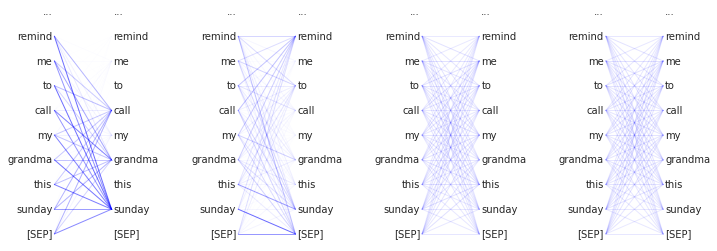

In [9]:
width = 3
example_sep = 3
word_height = 1
pad = 0.1


def plot_attn(example, heads):
  """Plots attention maps for the given example and attention heads."""

  for ei, (layer, head) in enumerate(heads):
    yoffset = 1
    xoffset = ei * width * example_sep

    attn = example["attns"][layer][head][-15:, -15:]
    attn = np.array(attn)
    attn /= attn.sum(axis=-1, keepdims=True)
    words = example["tokens"][-15:]
    words[0] = "..."
    n_words = len(words)

    for position, word in enumerate(words):
      plt.text(xoffset + 0, yoffset - position * word_height, word,
               ha="right", va="center")
      plt.text(xoffset + width, yoffset - position * word_height, word,
               ha="left", va="center")
    for i in range(1, n_words):
      for j in range(1, n_words):
        plt.plot([xoffset + pad, xoffset + width - pad],
                 [yoffset - word_height * i, yoffset - word_height * j],
                 color="blue", linewidth=1, alpha=attn[i, j])
        

plt.figure(figsize=(12, 4))
plt.axis("off")
plot_attn(data[581], [(0, 0), (2, 0), (7, 6), (10, 5)])
plt.show()

In [12]:
# next week my uncle birthday
# tell me time of alarm you set
# list all of my alarms
for i in range(len(data)):
    if data[i]['tokens'][1] == 'list':
        if data[i]['tokens'][2] == 'all':
            index = i 
            break
print(index)
data[index]['tokens']

925


['[CLS]', 'list', 'all', 'of', 'my', 'alarms', '[SEP]']

# Class : calendar_set

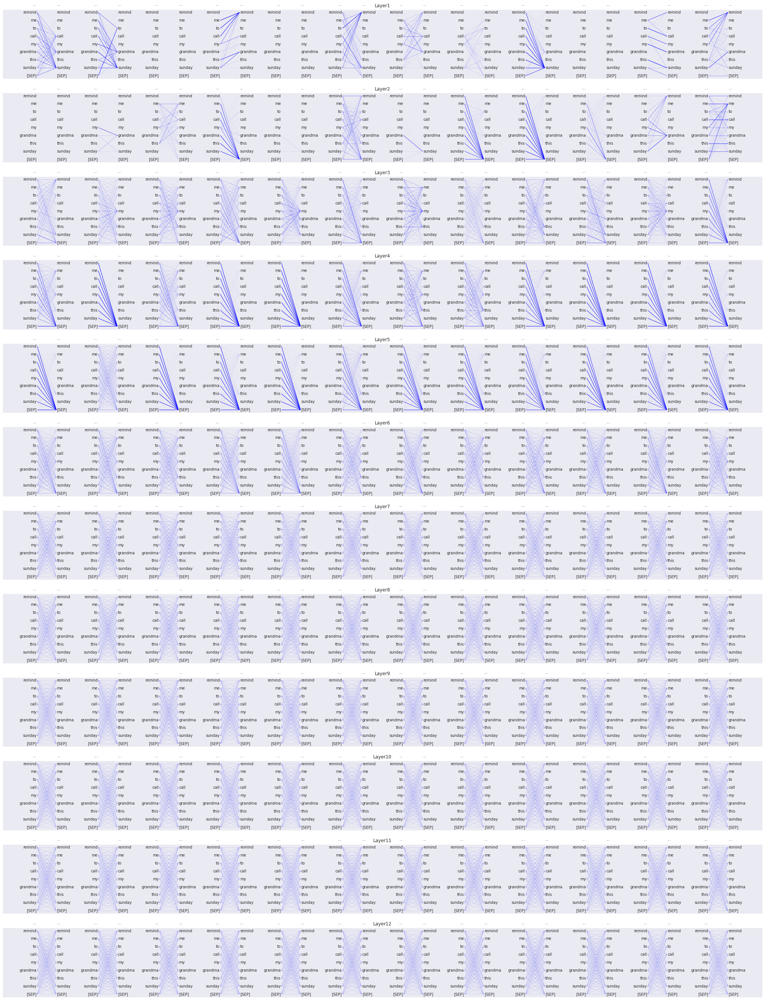

In [13]:
data_input = 581 # remind me to call my grandma this sunday # calendar_set
sns.set_style("dark")
plt.figure(figsize=(36, 48))
for i in range(12):
    plt.subplot(12, 1, i+1)
    plot_attn(data[data_input], [(i, 0), (i, 1), (i, 2),(i, 3),(i, 4), (i, 5),(i, 6), (i, 7), (i, 8),(i, 9), (i, 10), (i, 11)])
    plt.title("Layer"+str(i+1))
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

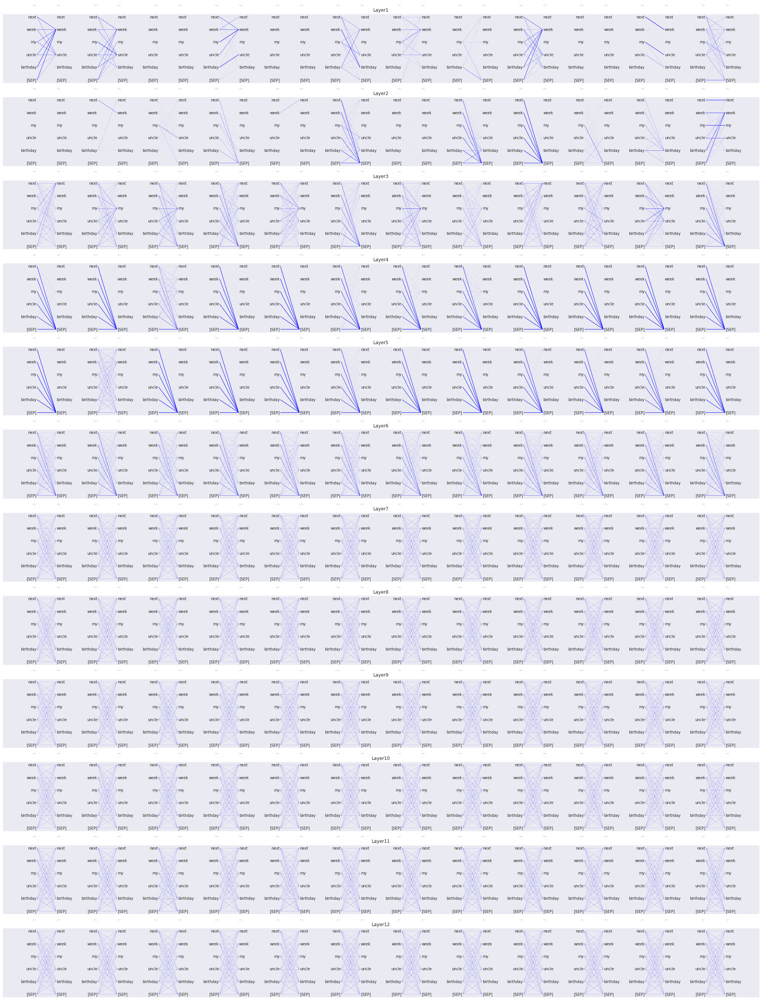

In [14]:
data_input = 860
sns.set_style("dark")
plt.figure(figsize=(36, 48))
for i in range(12):
    plt.subplot(12, 1, i+1)
    plot_attn(data[data_input], [(i, 0), (i, 1), (i, 2),(i, 3),(i, 4), (i, 5),(i, 6), (i, 7), (i, 8),(i, 9), (i, 10), (i, 11)])
    plt.title("Layer"+str(i+1))
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()  

# Class : alarm_query 

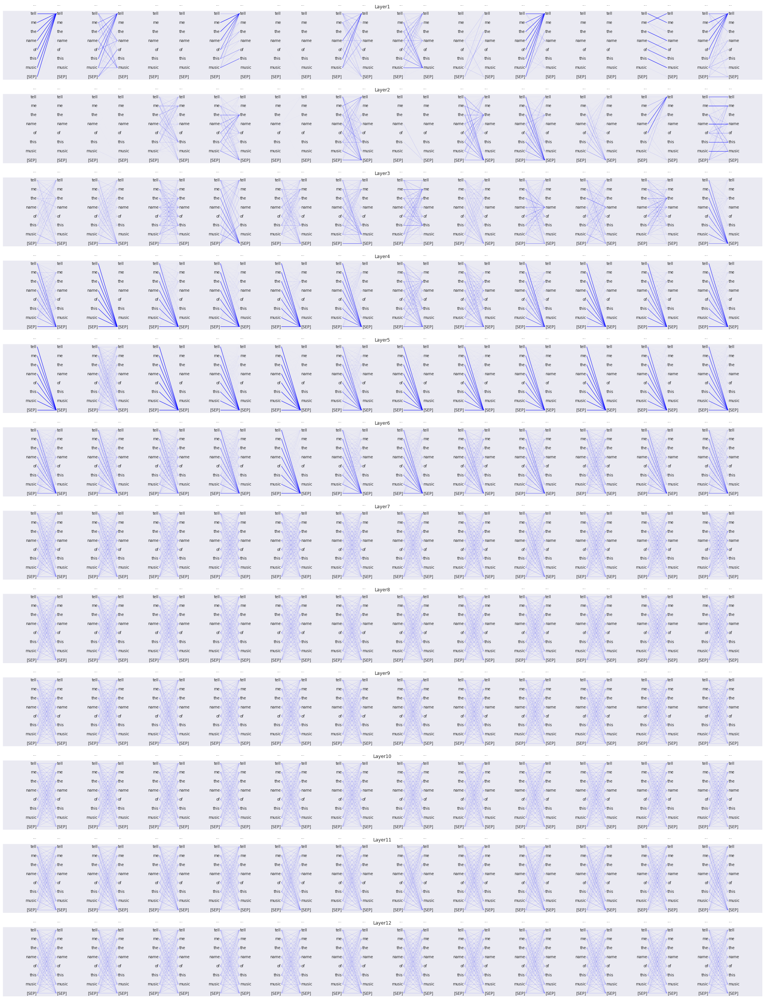

In [15]:
data_input = 185 # remind me to call my grandma this sunday # calendar_set
sns.set_style("dark")
plt.figure(figsize=(36, 48))
for i in range(12):
    plt.subplot(12, 1, i+1)
    plot_attn(data[data_input], [(i, 0), (i, 1), (i, 2),(i, 3),(i, 4), (i, 5),(i, 6), (i, 7), (i, 8),(i, 9), (i, 10), (i, 11)])
    plt.title("Layer"+str(i+1))
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()

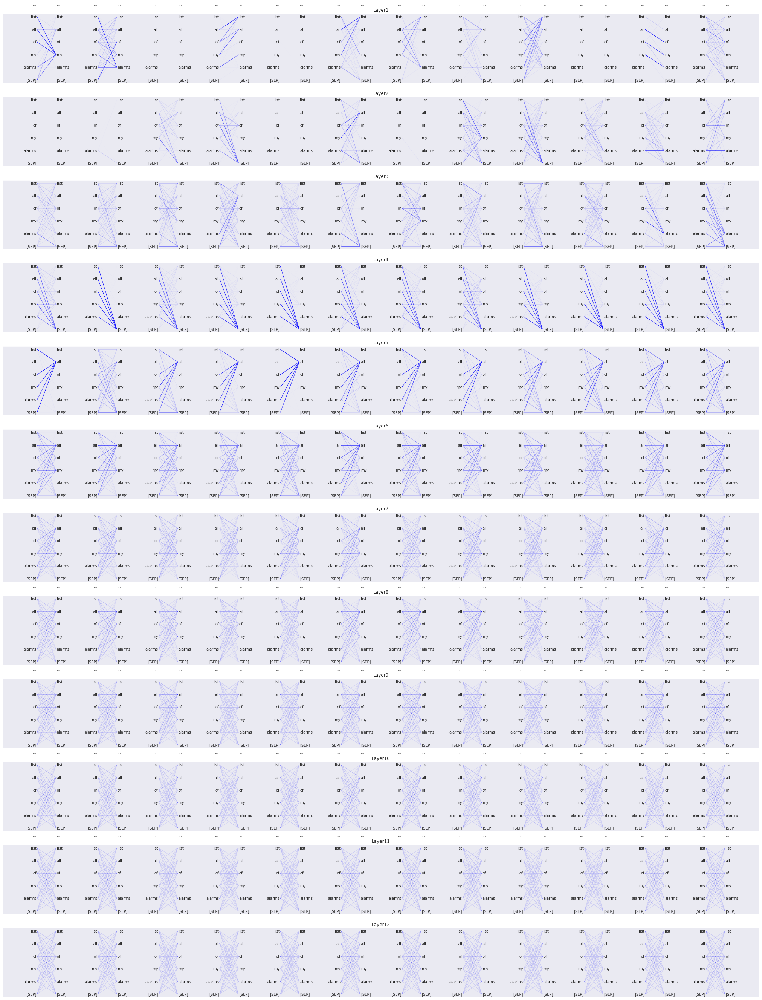

In [16]:
data_input = 925
sns.set_style("dark")
plt.figure(figsize=(36, 48))
for i in range(12):
    plt.subplot(12, 1, i+1)
    plot_attn(data[data_input], [(i, 0), (i, 1), (i, 2),(i, 3),(i, 4), (i, 5),(i, 6), (i, 7), (i, 8),(i, 9), (i, 10), (i, 11)])
    plt.title("Layer"+str(i+1))
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()  

# Class : alarm_remove

In [18]:
# turn off my first alarm
# please cancel all alarms for tomorrow
for i in range(len(data)):
    if data[i]['tokens'][1] == 'please':
        if data[i]['tokens'][2] == 'cancel':
            index = i 
            break
print(index)
data[index]['tokens']

785


['[CLS]', 'please', 'cancel', 'all', 'alarms', 'for', 'tomorrow', '[SEP]']

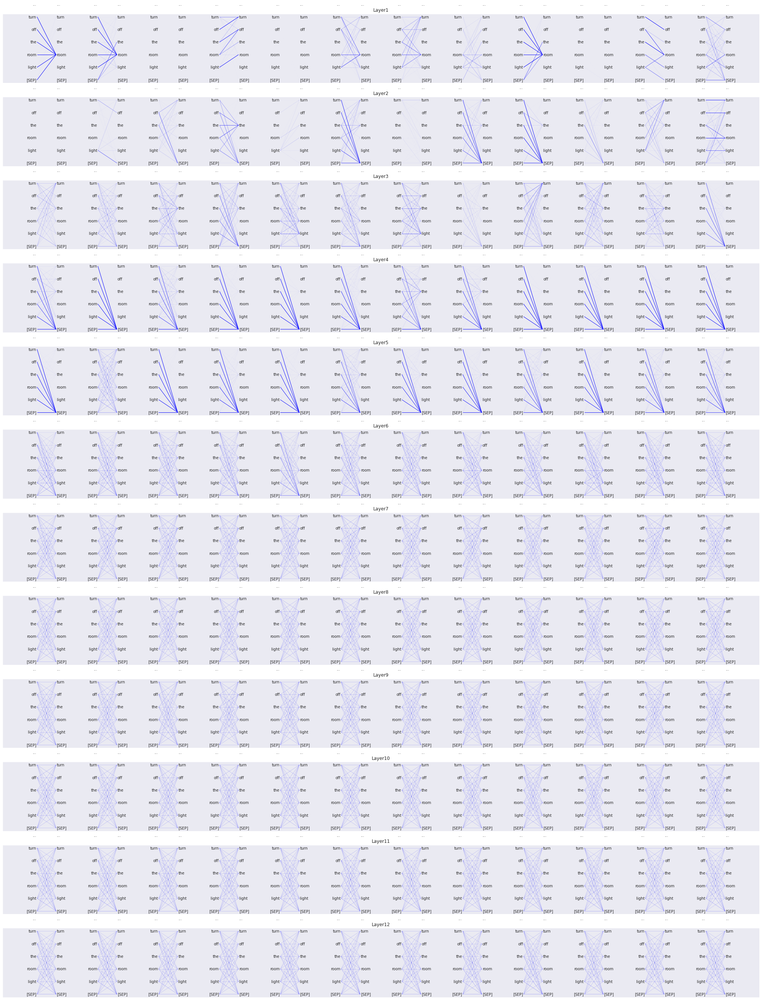

In [19]:
data_input = 20
sns.set_style("dark")
plt.figure(figsize=(36, 48))
for i in range(12):
    plt.subplot(12, 1, i+1)
    plot_attn(data[data_input], [(i, 0), (i, 1), (i, 2),(i, 3),(i, 4), (i, 5),(i, 6), (i, 7), (i, 8),(i, 9), (i, 10), (i, 11)])
    plt.title("Layer"+str(i+1))
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()  

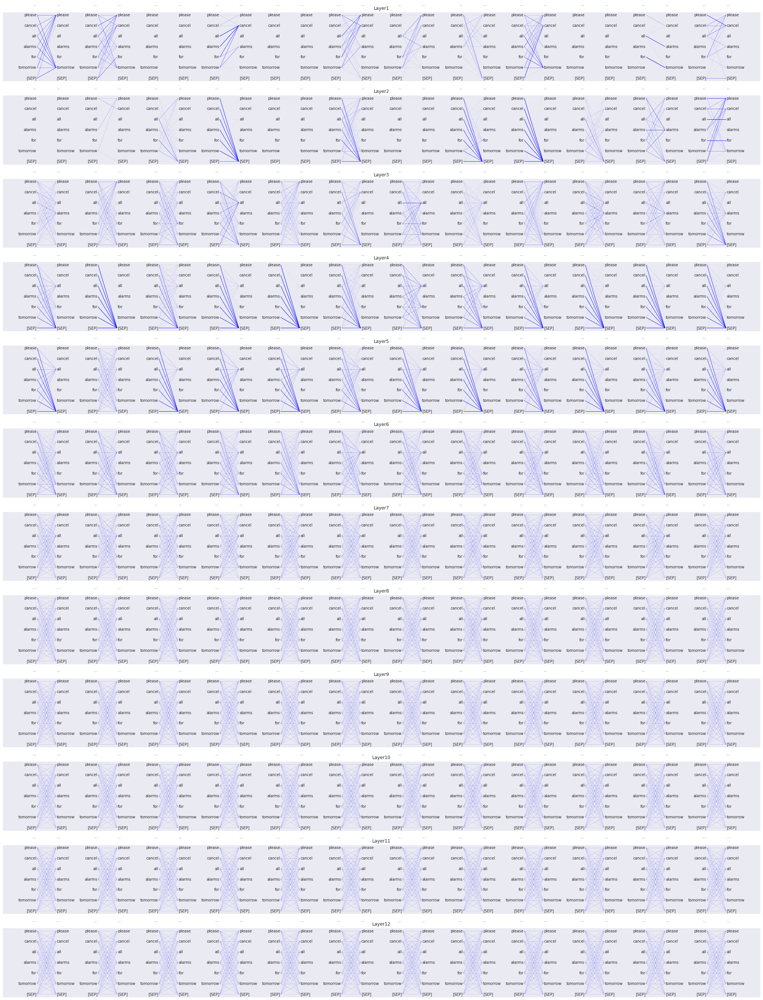

In [20]:
data_input = 785
sns.set_style("dark")
plt.figure(figsize=(36, 48))
for i in range(12):
    plt.subplot(12, 1, i+1)
    plot_attn(data[data_input], [(i, 0), (i, 1), (i, 2),(i, 3),(i, 4), (i, 5),(i, 6), (i, 7), (i, 8),(i, 9), (i, 10), (i, 11)])
    plt.title("Layer"+str(i+1))
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()  